<a href="https://colab.research.google.com/github/wing787/books-python-satellite-data-analysis-basic/blob/main/9_ch5_linearRegression.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 5-1 線形回帰
## 5-1-1. この章で学習すること
1. 線形回帰とは
2. 線形回帰の理論的背景
3. 実際にやってみる

(以降、書籍抜粋、文言編集)

## 5-1-2. 線形回帰とは？

観測されているある変数を予測したいときに、他の変数を用いて関数を予測することを回帰分析と呼ぶ。線形回帰とは、この予測したい関数を直線として分析する回帰分析のことを言う。  
ここでは全てのデータを変数と呼ぶが、厳密には観測されている結果の変数(予測したい変数)を目的変数、その結果の原因になっている変数を説明変数と呼ぶ。目的変数は従属変数、結果変数、被説明変数とも呼ばれる。説明変数は独立変数や予測変数とも呼ばれる。

## 5-1-3. 線形回帰の理論的背景  
説明変数を$X_i$、目的変数を$Y$としたとき、線形回帰は一般的に次のような式で表される。  
$
Y = \beta_0 + \beta_1X_1 + \beta_2X_2 + ... + \beta_kX_k
$  
ここで$\beta_0$は切片(定数)、$\beta_1$は説明変数、$k$は説明変数の個数である。  
1つの目的変数を1つの説明変数で予測する手法を単回帰分析という。たとえば、「客数から売上を予測する」といったケースが該当し、回帰の中でも最も簡単な手法といえる。  
この時、線形回帰の式は上の式を$k=1$として次のようになる。  
$
Y = \beta_0 + \beta_1X_1
$  

一方、1つの目的変数を複数の説明変数で予測する手法を重回帰分析という。たとえば、「客数と気温から売上を予測する」といったケースが該当する。  
$
Y = \beta_0 + \beta_1x+ \beta_2x^2
$  
というモデルも、線形回帰に分類される。これは係数$\beta$に対して線形であるからである。

## 5-1-4. 最小二乗法とは
線形回帰では最小二乗法という方法が用いられている。得られたデータの点と回帰直線の間の距離（**残差**）を最小にする方法である。とてもシンプルな方法で、イメージとしては次の図になる。


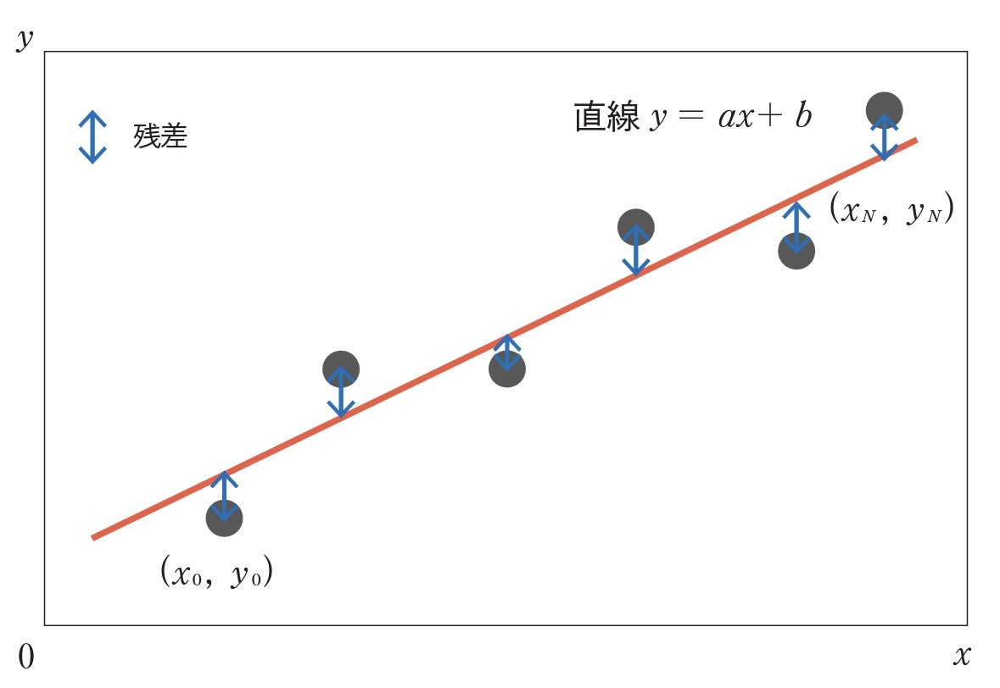

この図における青い点は手元に得られたデータであり、(x, y)座標で表されている。赤い線は回帰直線であり、$y=ax+b$とおく。  
このとき、(x, y)とその直線とのy方向の残差は$| y-(ax+b) |$となる。この残差の二乗和$\sum\{y-(ax+b)\}^2$が最小となる直線を求めるのが最小二乗法の考え方である。

## 5-1-5. 実際にやってみる
サンプルデータとして森林樹高のグランドトゥルースデータ(正解情報)を用いて、まずは衛星画像から導き出されるNDVI値だけの1つの変数を使った単回帰分析を行う。  
手順は次の通り。
1. グランドトゥルースデータの準備
2. 衛星画像データSentinel-2の準備
3. 教師データ作成のための点データ準備
4. 線形回帰の実行

### [Step1] グランドトゥルースデータの準備
静岡県伊豆半島の樹高データを扱う。このデータは航空レーザー測量を利用して作成した、5mメッシュの樹高データである。  
データ出展元：[ふじのくにオープンデータカタログ 静岡県樹高分布図（伊豆_1）](https://opendata.pref.shizuoka.jp/dataset/fuji-71.html)

In [2]:
# # Google Colabを使っている場合には、ドライブのマウントを行います
# from google.colab import drive
# drive.mount('/content/drive')

In [3]:
# !pip install rasterio
# !pip install geojson
# !pip install rioxarray
# !pip install rasterstats
# !pip install earthpy
# !pip install cartopy
# !pip install pygeos
# !pip install rtree
# !pip install sat-search
# !pip install pystac-client

In [4]:
from ast import increment_lineno
import os
os.environ['USE_PYGEOS'] = '0'
from osgeo import gdal, gdalconst, gdal_array
import numpy as np
import pandas as pd
import geopandas as gpd
import rasterio as rio
from rasterio.plot import show
import rasterio.mask
from rasterio.crs import CRS
import rioxarray as rxr
from shapely.geometry import MultiPolygon, Polygon, box
import rasterstats as rs
import earthpy.spatial as es
import earthpy.plot as ep
import random
import matplotlib.pyplot as plt
from PIL import Image
import zipfile
from fiona.crs import from_epsg
import json
import requests
from satsearch import Search
from pystac_client import Client
from io import BytesIO
import urllib
import warnings
from skimage import io
warnings.filterwarnings('ignore')
%matplotlib inline
plt.rcParams['figure.dpi'] = 250

print('done')

done


### [Step 2]画像のリサンプリング
今回使用するSentinel-2の衛星画像は地上分解能が10mですが、グランドトゥルースデータ（以下、伊豆データ）である樹高データは分解能を合わせる必要があり、この作業をリサンプリングという。  
今回は5m分解能の伊豆データをSentinel-2の10m分解能に合わせる。分解能を下げるリサンプリングを特にダウンサンプリングという。

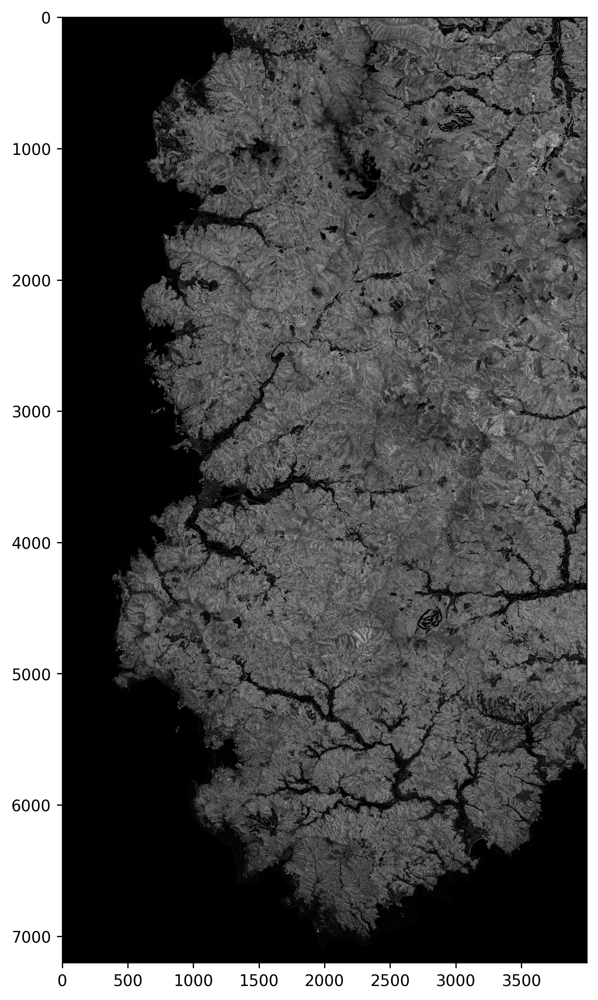

In [5]:
# 画像サイズに合わせて数値設定
offx = 0
offy = 0
cols = 4000
rows = 7200

tif = gdal.Open('/content/drive/MyDrive/Colab Notebooks/Pythonで学ぶ衛星データ解析基礎-環境変化を定量的に把握しよう/data/5/Izu_1.tif', gdalconst.GA_ReadOnly)
izuimg = tif.GetRasterBand(1).ReadAsArray(offx, offy, cols, rows)

# 画像データの値に合わせて設定
plt.figure(figsize = (6, 12))
plt.imshow(izuimg, cmap='gray', vmin=0, vmax=53, interpolation='none');

In [6]:
os.makedirs('/content/work', exist_ok=True)

ds = gdal.Open('/content/drive/MyDrive/Colab Notebooks/Pythonで学ぶ衛星データ解析基礎-環境変化を定量的に把握しよう/data/5/Izu_1.tif')

REPRJ_PATH = '/content/work/IzuReprj.tif'
DSTSRS = 'EPSG:32654'

# reproject
dsReprj = gdal.Warp(REPRJ_PATH, ds, dstSRS = DSTSRS)


RESMEAN = '/content/work/IzuResMean.tif'
XRES = 10
YRES = 10
RESAMPLEALG = 'average'

# resample 5m->10m
dsRes = gdal.Warp(RESMEAN, dsReprj, xRes=XRES, yRes=YRES, resampleAlg = RESAMPLEALG)  # リサンプリング後の解像度
# dsRes = gdal.Warp("IzuResNear.tif", dsReprj, xRes = 10, yRes = 10, resampleAlg = "near") # リサンプリング後の解像度 (10m)

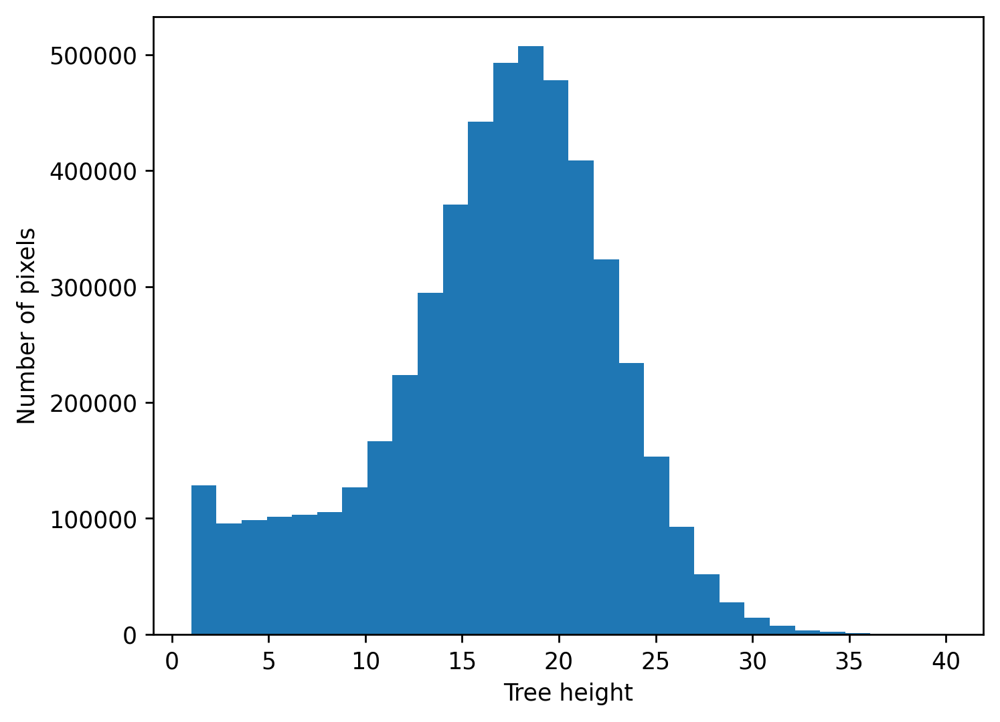

In [7]:
# 樹高データ
dsres_arr = dsRes.GetRasterBand(1).ReadAsArray()
# print(dsres_arr)

# ヒストグラム
tree_height_data = dsres_arr.flatten()

plt.xlabel('Tree height')
plt.ylabel('Number of pixels')
plt.hist(tree_height_data.ravel(), 30, [1, 40])  # 1m以上40m以下
plt.show();

### [Step 3]衛星画像データSentinel-2の準備
Sentinel-2のデータをダウンロードする。まずは画像の取得範囲を決定する。

In [8]:
# 伊豆半島の西側を関心領域に設定する。
from IPython.display import IFrame
SRC = 'https://www.keene.edu/campus/maps/tool/'
IFrame(SRC, width=960, height=500)


## 書籍より
# 138.7339597, 34.9782520
# 138.7312132, 34.8002724
# 138.8987502, 34.8081657
# 138.8877641, 34.9748762
# 138.7339597, 34.9782520

In [9]:
AOI = [
      [
        138.7339597,
        34.978252
      ],
      [
        138.7312132,
        34.8002724
      ],
      [
        138.8987502,
        34.8081657
      ],
      [
        138.8877641,
        34.9748762
      ],
      [
        138.7339597,
        34.978252
      ]
    ]

In [10]:
# 関心領域の最小緯度・経度、最大緯度・経度を取得します
areaLon = []
areaLat = []
# iterating each number in list
for coordinate in AOI:
  areaLon.append(coordinate[0])
  areaLat.append(coordinate[1])

minLon = np.min(areaLon) # min longitude
maxLon = np.max(areaLon) # max longitude
minLat = np.min(areaLat) # min latitude
maxLat = np.max(areaLat) # max latitude

In [11]:
def selSquare(minLon, minLat, maxLon, maxLat):
  c1 = [maxLon, maxLat]
  c2 = [maxLon, minLat]
  c3 = [minLon, minLat]
  c4 = [minLon, maxLat]
  geometry = {'type': 'Polygon', 'coordinates': [[c1, c2, c3, c4, c1]]}
  return geometry

In [12]:
bbox = selSquare(minLon, minLat, maxLon, maxLat)
DATES = '2020-01-01/2020-12-31'

API_URL = 'https://earth-search.aws.element84.com/v0'
COLLECTION = 'sentinel-s2-l2a-cogs'  # Sentinel-2, Level 2A (BOA)
s2STAC = Client.open(API_URL, headers=[])
s2STAC.add_conforms_to('ITEM_SEARCH')


s2Search = s2STAC.search(
    intersects = bbox,
    datetime = DATES,
    query = {'eo:cloud_cover': {'it': 30}, 'sentinel:valid_cloud_cover': {'eq': True}},
    collections = COLLECTION
)

s2_items = [i.to_dict() for i in s2Search.get_items()]
print(f'{len(s2_items)} のシーンを取得')

144 のシーンを取得


In [13]:
print(bbox)

{'type': 'Polygon', 'coordinates': [[[138.8987502, 34.978252], [138.8987502, 34.8002724], [138.7312132, 34.8002724], [138.7312132, 34.978252], [138.8987502, 34.978252]]]}


In [14]:
items = s2Search.get_all_items()
gdf = gpd.GeoDataFrame.from_features(items.to_dict(), crs='epsg:4326')
# 雲量で並び替え
gdfSorted = gdf.sort_values('eo:cloud_cover').reset_index(drop=True)
gdfSorted.head()

,geometry,datetime,platform,constellation,instruments,gsd,view:off_nadir,proj:epsg,sentinel:utm_zone,sentinel:latitude_band,sentinel:grid_square,sentinel:sequence,sentinel:product_id,sentinel:data_coverage,eo:cloud_cover,sentinel:valid_cloud_cover,created,updated,data_coverage
0,"POLYGON ((138.82851 34.23370, 138.80247 35.223...",2020-12-23T01:37:33Z,sentinel-2b,sentinel-2,[msi],10,0,32654,54,S,UD,0,S2B_MSIL2A_20201223T013049_N0214_R074_T54SUD_2...,100.0,0.00,True,2020-12-26T01:09:12.361Z,2020-12-26T01:09:12.361Z,NaN
1,"POLYGON ((137.74383 34.20968, 137.70483 35.198...",2020-05-02T01:37:43Z,sentinel-2a,sentinel-2,[msi],10,0,32654,54,S,TD,0,S2A_MSIL2A_20200502T012701_N0214_R074_T54STD_2...,100.0,0.00,True,2020-09-19T00:36:59.662Z,2020-09-19T00:36:59.662Z,100.0
2,"POLYGON ((137.74383 34.20968, 137.70483 35.198...",2020-12-08T01:37:37Z,sentinel-2a,sentinel-2,[msi],10,0,32654,54,S,TD,0,S2A_MSIL2A_20201208T013041_N0214_R074_T54STD_2...,100.0,0.01,True,2020-12-08T06:35:20.064Z,2020-12-08T06:35:20.064Z,NaN
3,"POLYGON ((137.74383 34.20968, 137.70483 35.198...",2020-08-15T01:37:43Z,sentinel-2b,sentinel-2,[msi],10,0,32654,54,S,TD,0,S2B_MSIL2A_20200815T012659_N0214_R074_T54STD_2...,100.0,0.05,True,2020-08-17T06:26:28.759Z,2020-08-17T06:26:28.759Z,NaN
4,"POLYGON ((138.82851 34.23370, 138.80247 35.223...",2020-05-02T01:37:39Z,sentinel-2a,sentinel-2,[msi],10,0,32654,54,S,UD,0,S2A_MSIL2A_20200502T012701_N0214_R074_T54SUD_2...,100.0,0.05,True,2020-09-20T08:41:11.778Z,2020-09-20T08:41:11.778Z,100.0


In [15]:
from matplotlib.image import thumbnail
def sel_items(scene_items, product_id):
  item = [x.assets for x in scene_items\
          if x.properties['sentinel:product_id'] == product_id]
  thumbUrl = [x.assets['thumbnail'].href for x in scene_items\
          if x.properties['sentinel:product_id'] == product_id]
  return item, thumbUrl


selected_item, thumbUrl = sel_items(items, gdfSorted['sentinel:product_id'][1])  # 2020-05-02を選択。[0]の場合2020-12-23になり、意図しない範囲になる。
print(thumbUrl)
print()
print(selected_item)

['https://roda.sentinel-hub.com/sentinel-s2-l1c/tiles/54/S/TD/2020/5/2/0/preview.jpg']

[{'overview': <Asset href=https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/54/S/TD/2020/5/S2A_54STD_20200502_0_L2A/L2A_PVI.tif>, 'thumbnail': <Asset href=https://roda.sentinel-hub.com/sentinel-s2-l1c/tiles/54/S/TD/2020/5/2/0/preview.jpg>, 'metadata': <Asset href=https://roda.sentinel-hub.com/sentinel-s2-l2a/tiles/54/S/TD/2020/5/2/0/metadata.xml>, 'B11': <Asset href=https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/54/S/TD/2020/5/S2A_54STD_20200502_0_L2A/B11.tif>, 'B01': <Asset href=https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/54/S/TD/2020/5/S2A_54STD_20200502_0_L2A/B01.tif>, 'B12': <Asset href=https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/54/S/TD/2020/5/S2A_54STD_20200502_0_L2A/B12.tif>, 'B02': <Asset href=https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/54/S/TD/2020/5/S2A_54STD_20200502_0_

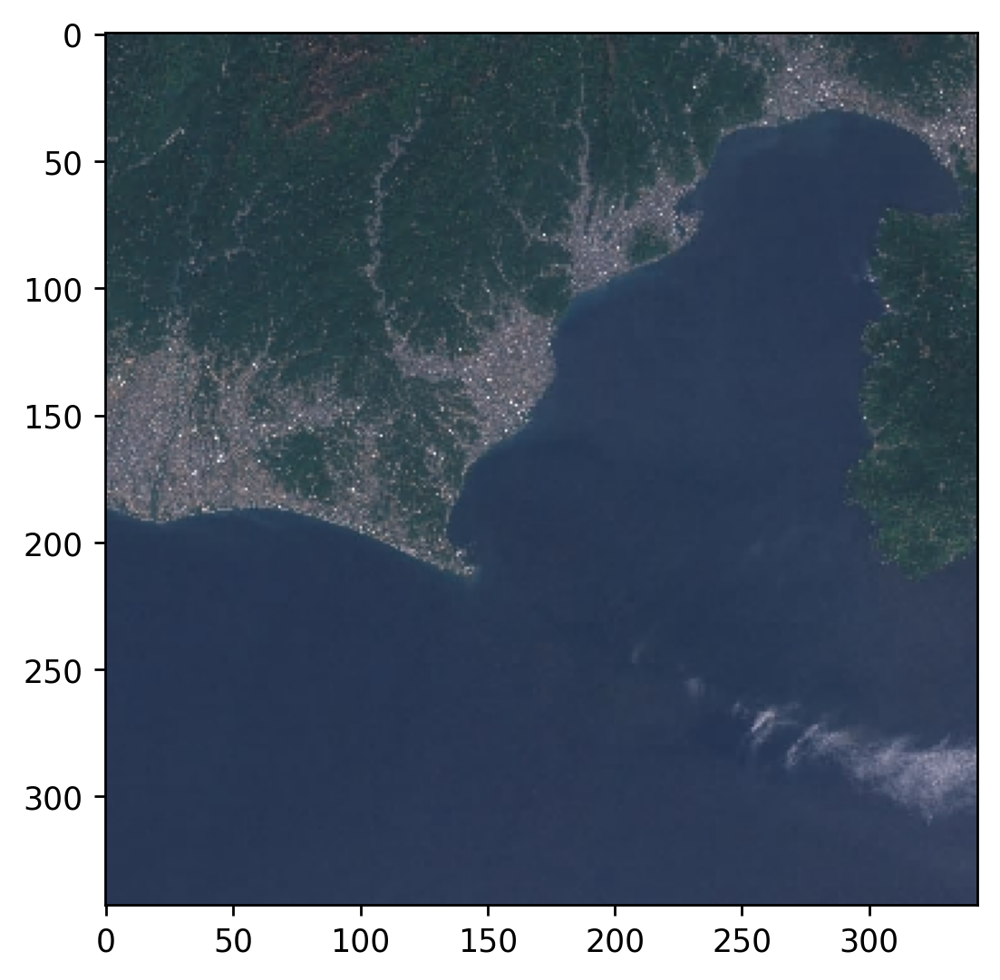

In [16]:
thumbImg = Image.open(BytesIO(requests.get(thumbUrl[0]).content))
plt.figure(figsize=(5, 5))
plt.imshow(thumbImg);

In [17]:
def getPreview(thumbList, r_num, c_num, figsize_x=12, figsize_y=12):
  """
  サムネイル画像を指定した引数に応じて行列状に表示
  r_num: 行数
  c_num: 列数
  """
  thumbs = thumbList
  f, ax_list = plt.subplots(r_num, c_num, figsize=(figsize_x,figsize_y))
  for row_num, ax_row in enumerate(ax_list):
    for col_num, ax in enumerate(ax_row):
      if len(thumbs) < r_num*c_num:
        len_shortage = r_num*c_num - len(thumbs) # 行列の不足分を算出
        count = row_num * c_num + col_num
        if count < len(thumbs):
          ax.label_outer() # サブプロットのタイトルと、軸のラベルが被らないようにします
          ax.imshow(io.imread(thumbs[row_num * c_num + col_num]))
          ax.set_title(thumbs[row_num * c_num + col_num][60:79])
        else:
          for i in range(len_shortage):
            blank = np.zeros([100,100,3],dtype=np.uint8)
            blank.fill(255)
            ax.label_outer()
            ax.imshow(blank)
      else:
        ax.label_outer()
        ax.imshow(io.imread(thumbs[row_num * c_num + col_num]))
        ax.set_title(thumbs[row_num * c_num + col_num][60:79])
  return plt.show();

In [18]:
allthumbUrl = []
for item in items:
  allthumbUrl.append(item.assets['thumbnail'].href)

len(allthumbUrl)

144

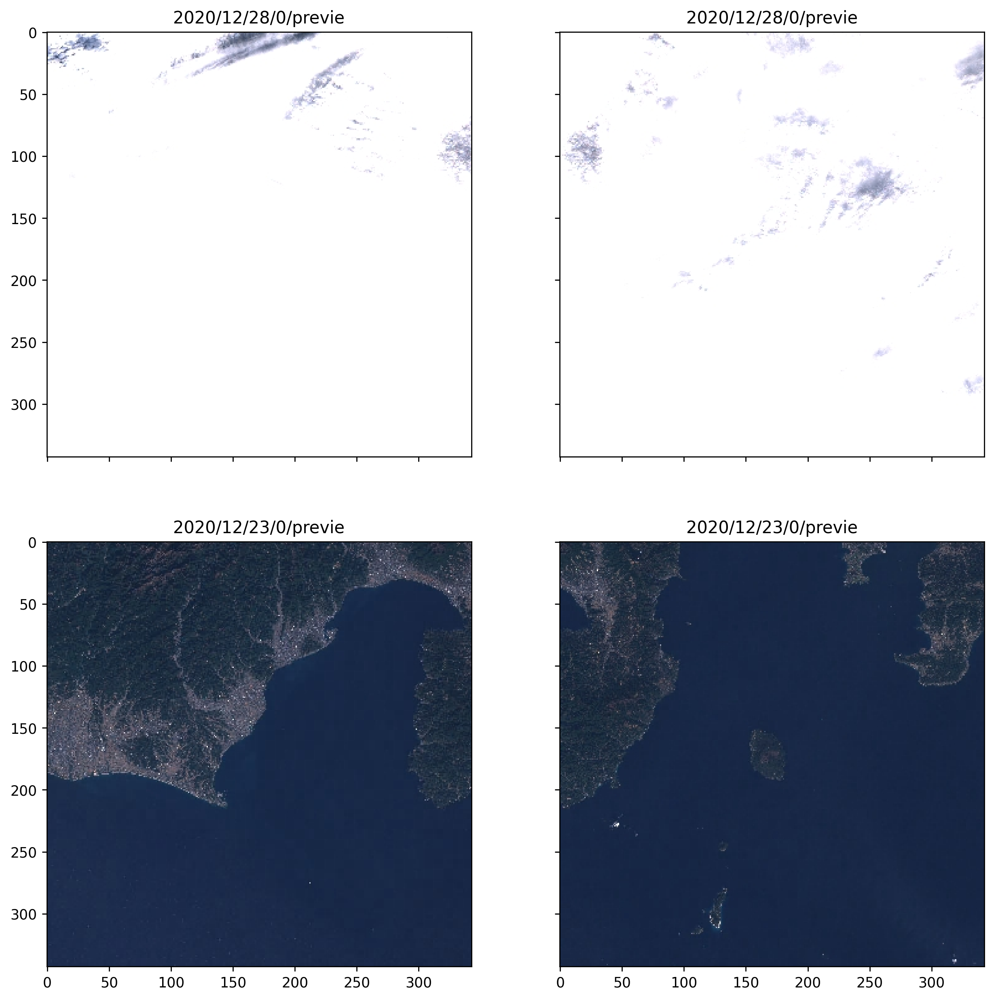

In [19]:
getPreview(allthumbUrl, 2, 2)

In [20]:
# 引用：https://note.nkmk.me/python-download-web-images/
def download_file(url, dst_path):
   try:
       with urllib.request.urlopen(url) as web_file, open(dst_path, 'wb') as local_file:
           local_file.write(web_file.read())
   except urllib.error.URLError as e:
       print(e)

def download_file_to_dir(url, dst_dir):
   download_file(url, os.path.join(dst_dir, os.path.basename(url)))

In [21]:
os.makedirs('sentinel2_ndvi',exist_ok=True)
RGB_DIR = "/content/sentinel2_ndvi"

# NDVIを作成するために赤バンドと近赤外バンドのデータを取得
bandLists = ['B04','B08']

# 画像のURL取得
file_url = []
[file_url.append(selected_item[0][band].href) for band in bandLists if file_url.append(selected_item[0][band].href) is not None]

# 画像のダウンロード
[download_file_to_dir(link, RGB_DIR) for link in file_url if download_file_to_dir(link, RGB_DIR) is not None]

[]

### [Step 4] 樹高データと行政区域データの読み込み
wgetを用いて静岡県の行政界データをダウンロードする。

In [22]:
!wget --restrict-file-names=nocontrol \
     --content-disposition \
     --user-agent="Mozilla/5.0 (Windows NT 10.0; Win64; x64; rv:52.0) Gecko/20100101 Firefox/52.0" \
     "https://opendata.pref.shizuoka.jp/fs/2/4/5/2/6/_/____35___.zip" \
     -P /content/work

--2023-10-22 01:18:01--  https://opendata.pref.shizuoka.jp/fs/2/4/5/2/6/_/____35___.zip
Resolving opendata.pref.shizuoka.jp (opendata.pref.shizuoka.jp)... 153.122.123.151
Connecting to opendata.pref.shizuoka.jp (opendata.pref.shizuoka.jp)|153.122.123.151|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2722988 (2.6M) [application/zip]
Saving to: ‘/content/work/合併後(35市町).zip’

合併後(35市町).zip  100%[===================>]   2.60M  1.98MB/s    in 1.3s    

2023-10-22 01:18:03 (1.98 MB/s) - ‘/content/work/合併後(35市町).zip’ saved [2722988/2722988]



In [23]:
with zipfile.ZipFile('/content/work/合併後(35市町).zip') as zipf:
  for zinfo in zipf.infolist():        # ZipInfoオブジェクトを取得
      if not zinfo.flag_bits & 0x800:  # flag_bitsプロパティで文字コードを取得
          # 文字コードが(cp437)だった場合はcp932へ変換する
          # strオブジェクトのプロパティencode/decodeでcp932に変換
          # 変換後のファイル名をfilenameプロパティで再度し直す
          zinfo.filename = zinfo.filename.encode('cp437').decode('cp932')
          if os.sep != "/" and os.sep in info.filename:
            info.filename = info.filename.replace(os.sep, "/")

      zipf.extract(zinfo, '/content/work')

In [24]:
# shpファイルをGeoPandasでデータフレームへ
gdf = gpd.read_file('/content/work/合併後（35市町）/行政界（H23）.shp', encoding='shift_jis')
# gdf = gdf.to_crs(crs="epsg:32654") # CRSの変更
gdf.head()

,ATTR_1,ATTR_10,ATTR_11,ATTR_12,ATTR_13,ATTR_2,ATTR_3,ATTR_4,ATTR_5,ATTR_6,ATTR_7,ATTR_8,ATTR_9,geometry
0,111214,59764.382945,菊川市,41.0,None,西部,袋井土木事務所,菊川市,22224.0,59764.383,静岡県,0.0,9.417037e+07,"POLYGON ((-33863.418 -132644.234, -33866.805 -..."
1,111214,81714.492253,袋井市,40.0,None,西部,袋井土木事務所,袋井市,22216.0,81714.492,静岡県,0.0,1.084182e+08,"POLYGON ((-56779.598 -131447.469, -56774.203 -..."
2,111122,58806.500767,河津町,3.0,河津町,伊豆,下田土木事務所,賀茂郡,22302.0,56342.800,静岡県,0.0,1.007258e+08,"MULTIPOLYGON (((42644.023 -128395.375, 42653.9..."
3,111122,85561.959743,西伊豆町,6.0,西伊豆町,伊豆,下田土木事務所,賀茂郡,22306.0,72636.800,静岡県,0.0,1.055035e+08,"MULTIPOLYGON (((24417.422 -126609.977, 24439.1..."
4,111122,46166.568834,東伊豆町,2.0,東伊豆町,伊豆,下田土木事務所,賀茂郡,22301.0,45298.700,静岡県,0.0,7.784293e+07,"MULTIPOLYGON (((48864.996 -123730.445, 48883.1..."


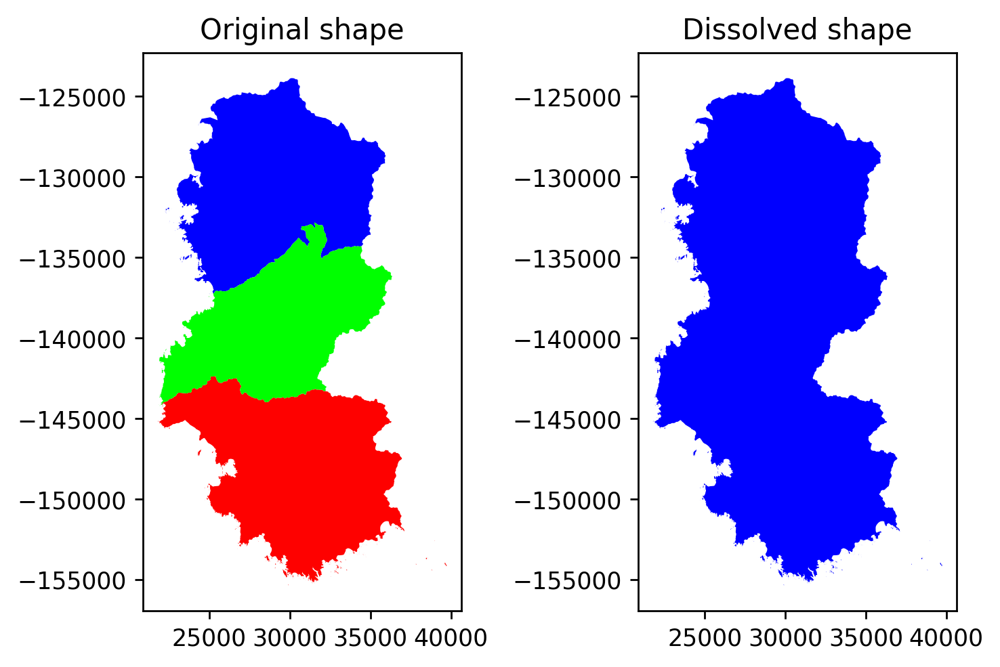

In [25]:
# 松崎町、南伊豆町、西伊豆町のみを行政界データから抽出抽出
gdfNishiIzu = gdf.loc[(gdf.ATTR_11 == '松崎町')|(gdf.ATTR_11 == '南伊豆町')|(gdf.ATTR_11 == '西伊豆町')]
# gdfNishiIzu

extractedGdf = gdfNishiIzu[['ATTR_7','ATTR_6','geometry']]
extractedGdf = extractedGdf.dissolve(by='ATTR_7',aggfunc='sum')

fig, (ax1,ax2) = plt.subplots(1,2,figsize=(6,12))
gdfNishiIzu.plot(ax=ax1,cmap='brg')
extractedGdf.plot(ax=ax2, cmap='brg')
ax1.set_title('Original shape')
ax2.set_title('Dissolved shape')
plt.tight_layout()
plt.show();

In [26]:
# 結合した行政界データを保存する
extractedGdf.to_file('/content/work/extractedExtent.geojson',driver='GeoJSON')

### 教師データ作成のための点データ準備
続いてこの領域から無作為に点を抽出する。この点を含んだピクセルの値を教師データとして取得するためである。
隣接する各点はそれぞれ500m程度離れている。

In [27]:
# geodataframeから、座標の最大最小を取得
x_min, y_min, x_max, y_max = extractedGdf.total_bounds
npoints = 1000  # set a sample size

random.seed(42)
allPoints = [(x, y) for x in range(int(x_min), int(x_max), 500) for y in range(int(y_min), int(y_max), 500)]
samplePoints = np.array(random.sample(allPoints, npoints))

x = samplePoints[:, 0]
y = samplePoints[:, 1]

# 取得した点をGeoSeriesへ変換
gdf_points = gpd.GeoSeries(gpd.points_from_xy(x, y))

# ポリゴン内のデータのみを保持
gdf_points = gdf_points[gdf_points.within(extractedGdf.unary_union)]
gdf_points = gdf_points.sample(n=500)  # sample 500 points
print(gdf_points)

173    POINT (29273.000 -140863.000)
476    POINT (26773.000 -134363.000)
422    POINT (27273.000 -139863.000)
429    POINT (33773.000 -144363.000)
613    POINT (29773.000 -153363.000)
                   ...              
601    POINT (29273.000 -141363.000)
33     POINT (33773.000 -133363.000)
928    POINT (25773.000 -126863.000)
162    POINT (22273.000 -143863.000)
506    POINT (29773.000 -135863.000)
Length: 500, dtype: geometry


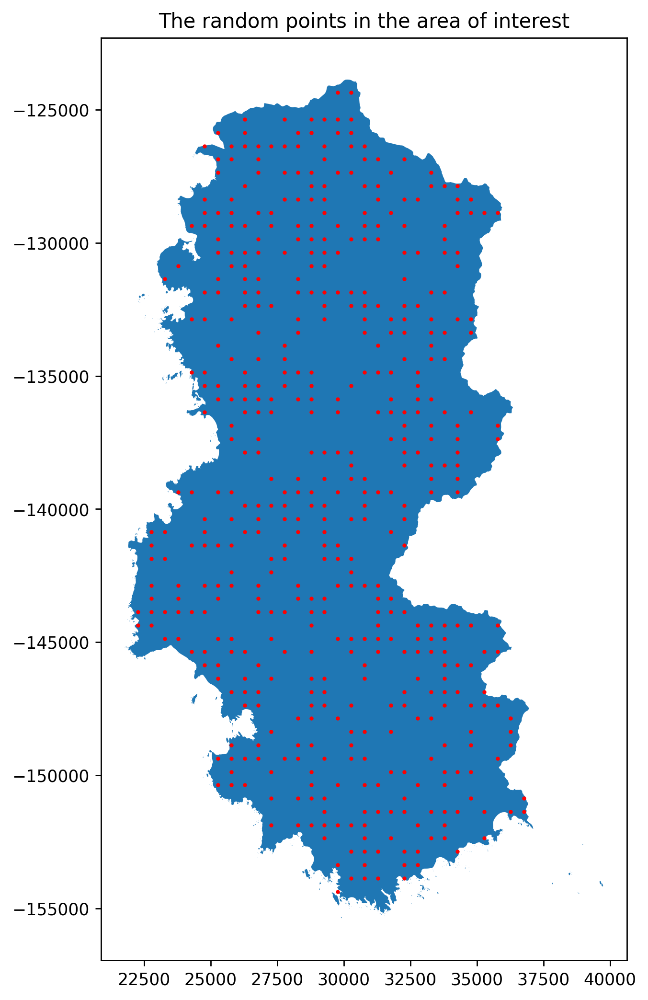

In [28]:
fig, ax = plt.subplots(figsize=(6, 10))
extractedGdf.plot(ax=ax)
gdf_points.plot(ax=ax, color='red', markersize=2)
ax.set_title('The random points in the area of interest')
plt.show();

In [29]:
# ポイントデータをgpkgとして保存
gdf_points = gdf_points.set_crs('epsg:2450')  # set its crs
point_shp = gpd.GeoDataFrame(geometry=gdf_points)
gdf_points.to_file('/content/work/RandomPoints2450.gpkg', layer='cities', driver='GPKG')

In [30]:
# S2の画像をクリッピング。加えてCRSの変換も行う。

def getFeatures(gdf):
  """rasterioで読み取れる形のデータに変換するための関数"""
  return [json.loads(gdf.to_json())['features'][0]['geometry']]

# 画像の読み込み
Rst_red = rxr.open_rasterio(file_url[0],masked=True).squeeze() # B04
Rst_nir = rxr.open_rasterio(file_url[1],masked=True).squeeze() # B08
# print(Rst_red.rio.crs)

# rastrio crsオブジェクトの作成。UTM Zone54NからからJGD2000 CS VIII（平面直角座標第8系）へ変換
jgd2000N8 = CRS.from_string('EPSG:2450')

# 投影変換
Rst_red_jgd = Rst_red.rio.reproject(jgd2000N8)
Rst_nir_jgd = Rst_nir.rio.reproject(jgd2000N8)

# 画像の切り抜き処理
bbox = box(x_min, y_min, x_max, y_max)
geo = gpd.GeoDataFrame(geometry=[bbox], crs="EPSG:2450")
coords = getFeatures(geo)
# 画像の切り抜き処理
Rst_red_clip = Rst_red_jgd.rio.clip(coords)
Rst_nir_clip = Rst_nir_jgd.rio.clip(coords)

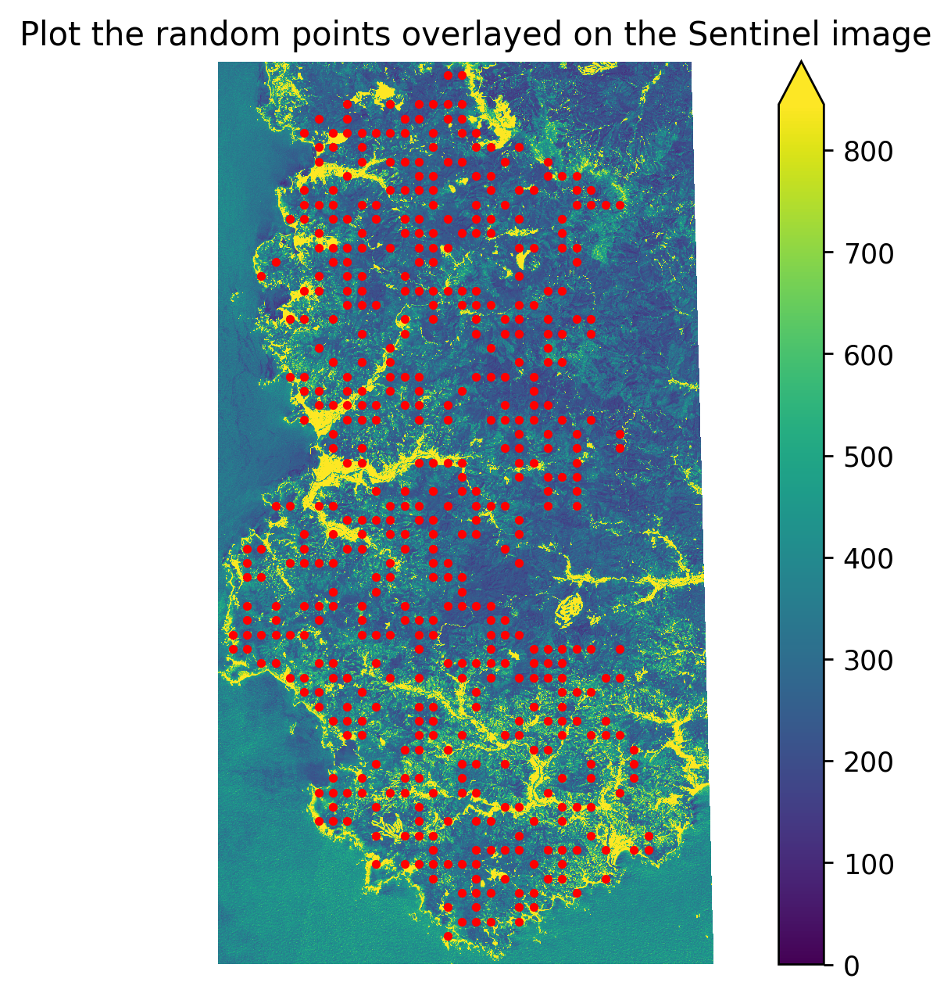

In [31]:
# Rst_red_clip.plot.hist(bins=10) # ピクセルの分布確認用
# 点データとラスタデータをmatplotlibのプロット上に表示する
fig, ax = plt.subplots(figsize=(6,6))
Rst_red_clip.plot.imshow(ax=ax,vmin=0,vmax=Rst_red_clip.quantile(0.95)) # Sentinel-2
point_shp.plot(ax=ax, color='red',markersize=5) # ポイントデータ
ax.set_title('Plot the random points overlayed on the Sentinel image')
ax.set_axis_off()
plt.show();

### NDVIの計算と取得
NDVIを衛星データから算出し、NDVIと樹高データで回帰分析を行う。

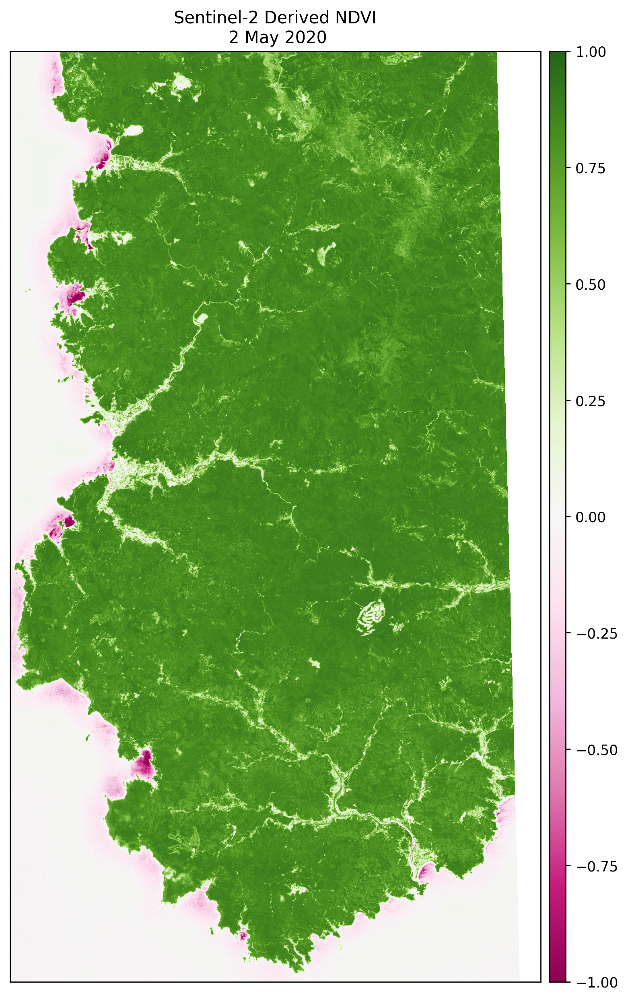

In [32]:
# make NDVI
ndvi_clip = es.normalized_diff(Rst_nir_clip, Rst_red_clip)

# output results image
ep.plot_bands(ndvi_clip,
              cmap='PiYG',
              scale=False,
              vmin=-1, vmax=1,
              title='Sentinel-2 Derived NDVI\n 2 May 2020')
plt.show();

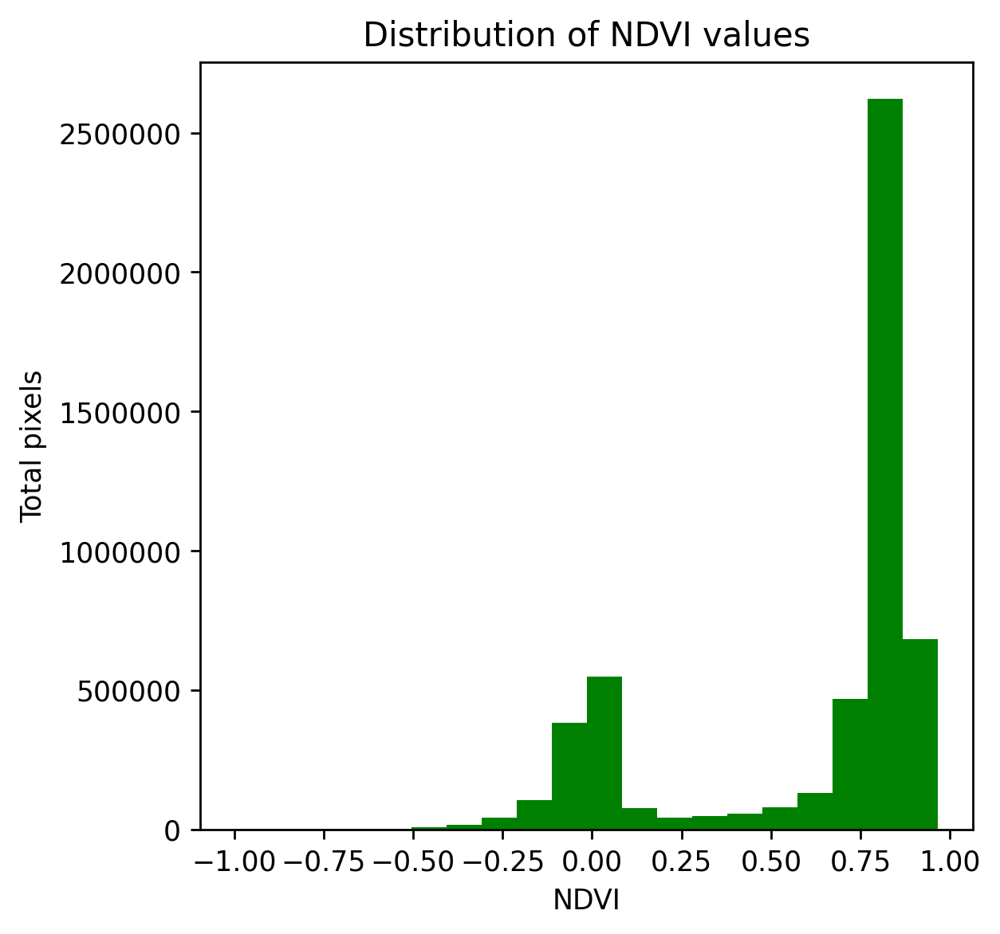

In [33]:
# make histgram
ax = ep.hist(ndvi_clip,
             figsize=(5, 5),
             colors='green',
             xlabel='NDVI',
             ylabel='Total pixels',
             title='Distribution of NDVI values')

#
ax[1].ticklabel_format(useOffset=False,
                       style='plain')

In [34]:
from rasterstats import point_query
ndvi = (Rst_nir_clip - Rst_red_clip)/ (Rst_nir_clip + Rst_red_clip)
# print(ndvi)

pointfile = '/content/work/RandomPoints2450.gpkg'
gdf_points = gpd.read_file(pointfile)

gdf_points_stats = pd.DataFrame(point_query(gdf_points, ndvi.values, \
                                            affine=ndvi.rio.transform(),nodata=-999))
gdf_points_stats.columns= ['ndvi']
ndvi_stats_df = gdf_points.join(gdf_points_stats)

In [35]:
ndvi_stats_df

,geometry,ndvi
0,POINT (29273.000 -140863.000),0.807897
1,POINT (26773.000 -134363.000),0.829380
2,POINT (27273.000 -139863.000),0.850762
3,POINT (33773.000 -144363.000),0.895609
4,POINT (29773.000 -153363.000),0.830276
...,...,...
495,POINT (29273.000 -141363.000),0.858235
496,POINT (33773.000 -133363.000),0.663113
497,POINT (25773.000 -126863.000),0.844296
498,POINT (22273.000 -143863.000),0.506017


In [36]:
# 以上の処理を樹高データにも行う。

# データの読み込み
tree_resampled = rxr.open_rasterio('/content/work/IzuResMean.tif', masked=True).squeeze()
tree_resampled_clip = tree_resampled.rio.clip(coords)

# 取得する樹木の高さを制限。最小で0mより高く、最大で40m以下とする
tree_resampled_clip_cont = tree_resampled_clip.where((tree_resampled_clip.values > 0)|(tree_resampled_clip.values <= 40),np.nan)

treeHeight_stats = pd.DataFrame(point_query(gdf_points, tree_resampled_clip_cont.values, \
                                            affine=tree_resampled_clip_cont.rio.transform(),nodata=-999))
treeHeight_stats.columns= ['tree_height']
treeHeight_stats_df = gdf_points.join(treeHeight_stats)

In [37]:
print("the minimum raster value is: ", np.nanmin(treeHeight_stats.values))
print("the maximum raster value is: ", np.nanmax(treeHeight_stats.values))

the minimum raster value is:  0.1691405302286181
the maximum raster value is:  30.366986846926817


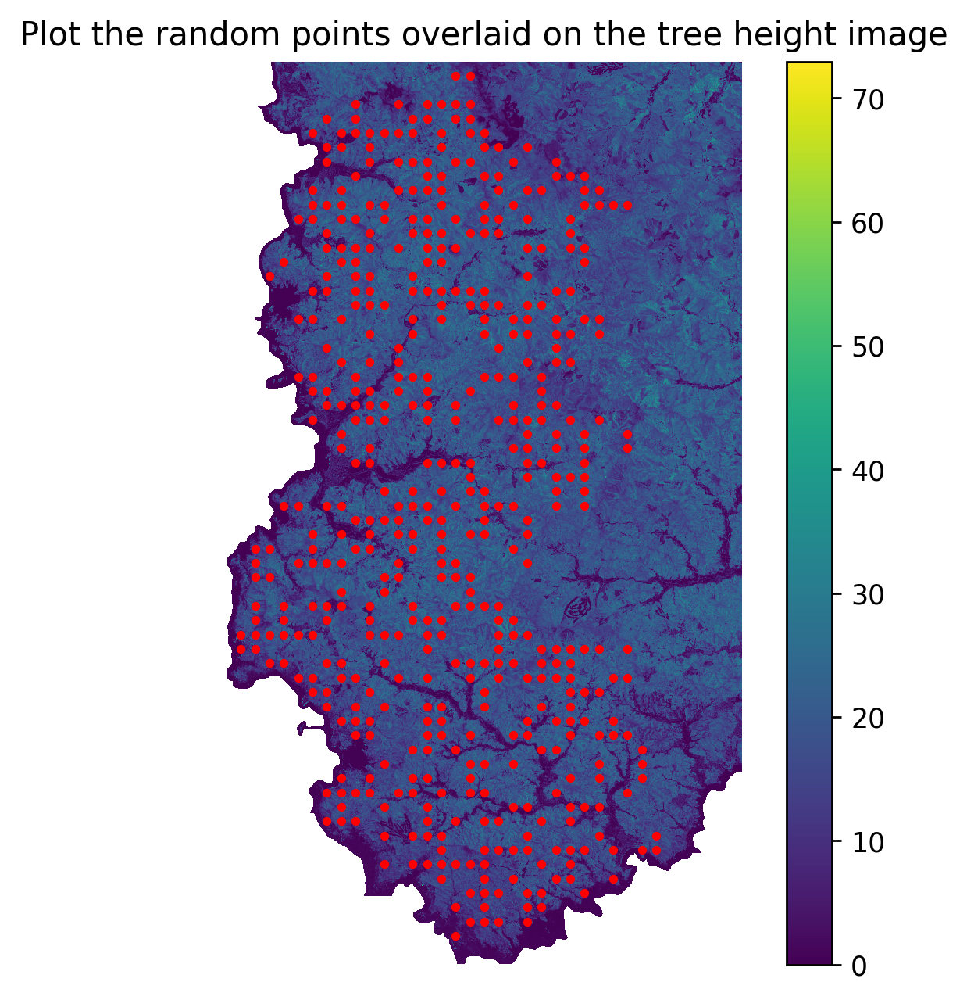

In [38]:
# 点データとラスタデータをmatplotlibのプロット上に表示する
fig, ax = plt.subplots(figsize=(6,6))
tree_resampled_clip.plot.imshow(ax=ax)
point_shp.plot(ax=ax, color='red',markersize=5) # ポイントデータ
ax.set_title('Plot the random points overlaid on the tree height image')
ax.set_axis_off()
plt.show();

In [39]:
# 二つのデータフレームを結合
combinedData = ndvi_stats_df.merge(treeHeight_stats_df, on='geometry')
combinedData = combinedData.dropna()

combinedData.head()

,geometry,ndvi,tree_height
0,POINT (29273.000 -140863.000),0.807897,23.635028
1,POINT (26773.000 -134363.000),0.829380,19.184047
2,POINT (27273.000 -139863.000),0.850762,21.709693
3,POINT (33773.000 -144363.000),0.895609,10.253400
4,POINT (29773.000 -153363.000),0.830276,4.023314


### 線形回帰の実行
データの準備が整ったので、単回帰を実行する。分類問題と同様に**scikit-learn**を実行する。  
(参考資料：https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html)

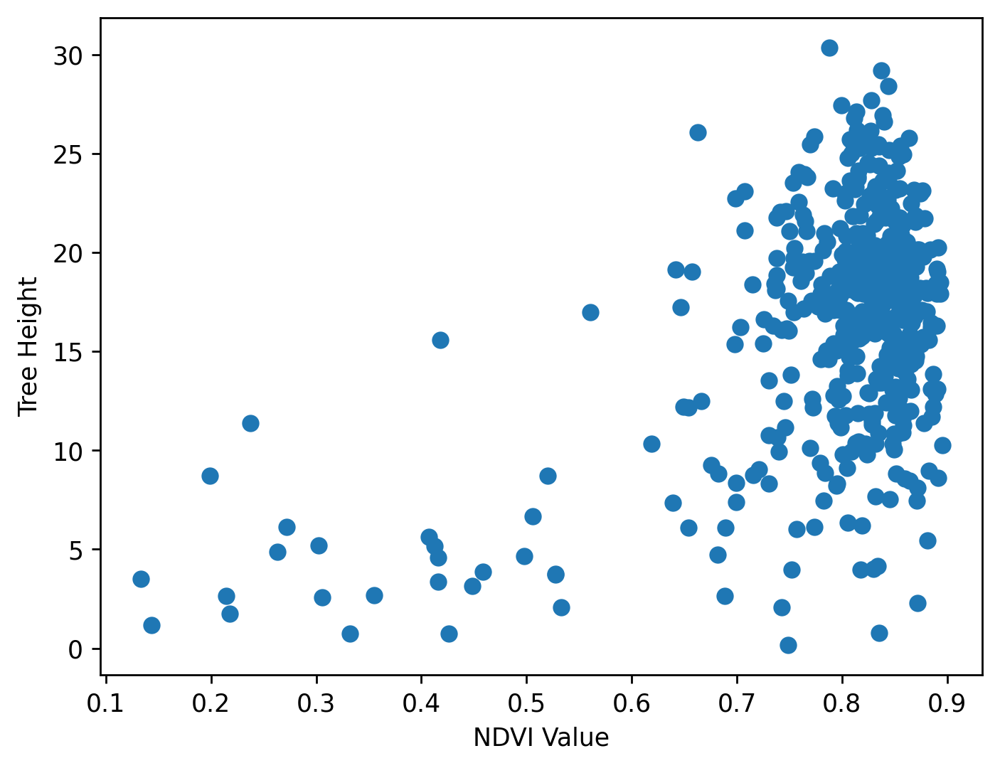

In [40]:
# Show data
x = combinedData['ndvi']
y = combinedData['tree_height']

plt.xlabel('NDVI Value')
plt.ylabel('tree_height')

plt.xlabel('NDVI Value')
plt.ylabel('Tree Height')
plt.plot(x, y, 'o')
plt.show();

In [41]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

# データセットをトレーニングデータとテストデータに分割
x = np.array(combinedData['ndvi']).reshape(-1, 1)
y = np.array(combinedData['tree_height']).reshape(-1, 1)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=0)

# shapeを使って次元を確認
print(x_train.shape, x_test.shape, y_train.shape, y_test.shape)

(400, 1) (100, 1) (400, 1) (100, 1)


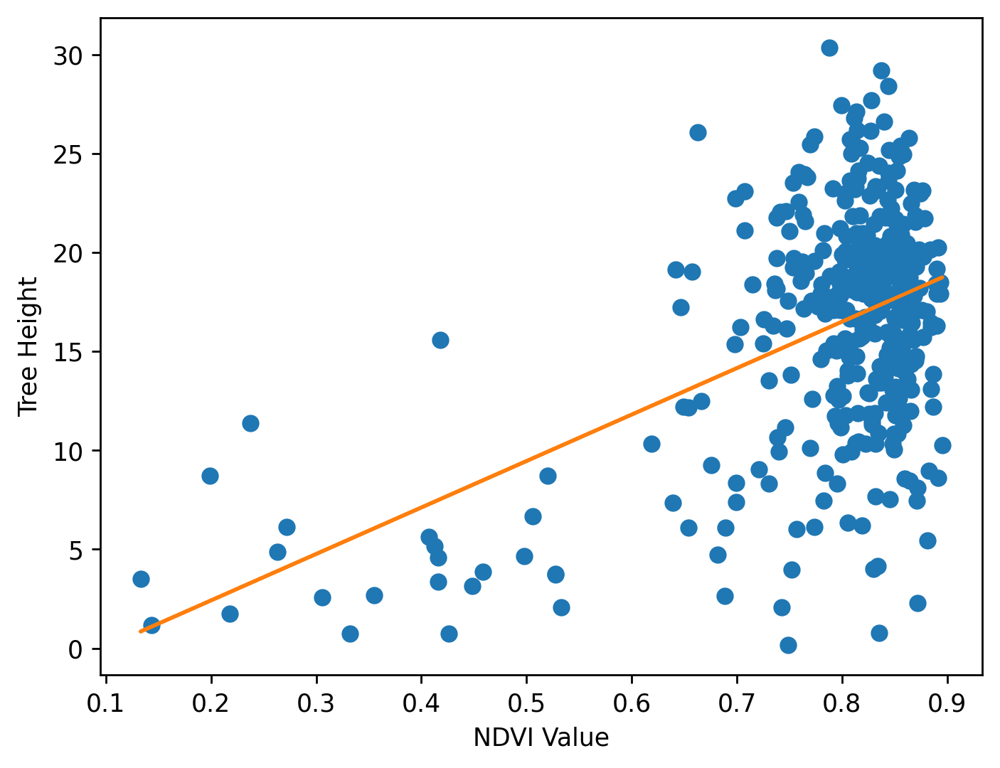

In [42]:
# LinearRegressionクラスのインスタンスを生成
lreg = LinearRegression()
# トレーニング用データを使ってトレーニング
lreg.fit(x_train, y_train)

plt.xlabel('NDVI Value')
plt.ylabel('Tree Height')
plt.plot(x_train, y_train, 'o')
plt.plot(x_train, lreg.predict(x_train), linestyle='solid')
plt.show();

In [43]:
print('y = %.3fx + %.3f' % (lreg.coef_, lreg.intercept_))  # モデル式
print('決定係数 R^2: ', round(lreg.score(x_train, y_train), 2))  # 決定係数によりモデルの当てはまりの良さを確認する

y = 23.481x + -2.280
決定係数 R^2:  0.23


In [44]:
# 訓練データと正解データでモデルの精度を確かめる
from sklearn import metrics
from math import sqrt

y_pred = lreg.predict(x_test)
testR2 = round(metrics.r2_score(y_test, y_pred), 2)
print('決定係数 R^2: ', testR2)

## 平均二乗誤差の確認
# print('X_testを使ったモデルの平均二乗誤差＝{:0.2f}'.format(np.mean((y_test - y_pred) ** 2))) # MSE
# RMSE
mse = metrics.mean_squared_error(y_test, y_pred)
rmse = sqrt(mse)
print('RMSE: ', round(rmse,2))

決定係数 R^2:  0.15
RMSE:  4.47


今回の結果では訓練データの決定係数が0.31程度、正解データに対しては0.24となり、NDVIから樹高を推測するというモデルは妥当とは言いがたいものといえる。  
また、RMSEは約5mとなり、該当地域の樹木高を考慮すれば、ここからもモデルの精度が高くないといえる。  
散布図やヒストグラムの結果からもわかるように外れ値の存在、データの偏り、などといった原因がモデルの精度に影響が与えていると考えられる。実際の解析ではモデル結果を精査するために、モデル診断(回帰診断)の手続きを行う。その過程を経て不要なデータを除いたり、単回帰が妥当な手法であったのか考えることになる。  
単回帰としてのモデルでは限界があるので、その場合には説明変数を増やし、重回帰モデルで検証することも重要である。扱う変数が増えた場合には、どの変数を含めるべきかの検討も行う必要がある。  
説明変数と独立変数の間で直線的な関係性が乏しいような場合には、曲線的な関係性をモデルで考慮する必要が生じる。  
（多項式回帰などがその代表例：https://qiita.com/tomoxxx/items/1045141b0219b3a21f32）